## Исследование рынка общественного питания Москвы

<font face='times new roman' size=4 font color='#5555FF'>**Цель исследования:**</font><br>
Заказчик - инвесторы из фонда «Shut Up and Take My Money». Необходимо изучить рынок общественного питания в Москве и помочь с выбором заведения: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.<br>

**Входные данные** - данные, с заведениями общественного питания Москвы, составленные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.<br>

<font face='times new roman' size=4 font color='#5555FF'>**Описание:**</font><br>
Изучаем информацию и приводим её в состояние пригодное для исследования: обрабатываем пропуски, дубликаты и аномальные значения. Далее проводим исследовательский анализ данных и устанавливаем: количество объектов общественного питания по категориям, количество посадочных мест, соотношение сетевых и несетевых заведений, топ-15 популярных сетей в Москве, рейтинги заведений по категориям и по районам Москвы.<br>

Исследование поможет инвесторам с определением места для открытия кофейни, оптимальным графиком работы и конкуретными ценами в сегменте.

## Чтение и проверка исходных данных

Импортируем необходимые библиотеки для начала работы.

In [1]:
import pandas as pd

import numpy as np

import seaborn as sns

import matplotlib.pyplot as plt

import plotly.express as px

from plotly import graph_objects as go

import json

import folium

from folium import Map, Choropleth, Marker

from folium.plugins import MarkerCluster

Читаем исходный файл и выводим первые строки.

In [2]:
from folium.plugins import MarkerCluster
df = pd.read_csv('moscow_places.csv')

Напишем функцию для ознакомления с датафреймами.

In [3]:
def print_df_info(df):
    display(df.head()) # первые строки
    print('\nОбщая информация:')
    print(df.info(), end='\n\n') # общая информация 
    print('Количество уникальных значений колонок:')
    for col in df.columns: # количество уникальных значений
        print(f'  {col}: {df[col].nunique()}')
    print('')
    print('Количество дубликатов:', df.duplicated().sum()) # количество явных дубликатов

In [4]:
print_df_info(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0



Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None

Количество уникальных значений колон

<div style="background-color: #CCCCCC;">

**Выводы:**<br>
Прочитали исходный файл и посмотрели на первые строки таблицы, а также общую информацию о датасете. Всего 8406 строк, что скорее всего означает общее количество заведений. Явные дубликаты отсутствуют. Выявлено значительное количество пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, и небольшой процент пропусков в столбце hours.
</div>

## Предобработка данных

Проведем предобработку, а также разведочный анализ входных данных.

### Обработка столбца name

Данные в столбце представляют собой названия заведений общественного питания.

In [5]:
df['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [6]:
df['name'].value_counts().head()

name
Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Name: count, dtype: int64

<div style="background-color: #CCCCCC;">

Всего 5614 различных названий. Причем топовым является обезличенное название Кафе - 189 строк. Помимо таких "Кафе", в столбце с названиями заведений присутствуют: Шаурма, Чайхана, Ресторан, Столовая. Что больше относится к типу заведения, а не к его названию.<br>
Возможно это является следствием человеческого фактора, потому как информация о названии заведений, могла быть добавлена пользователями.
</div>

### Обработка столбца category

Данные в столбце представляют собой типы заведений общественного питания.

In [7]:
df['category'].value_counts()

category
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

<div style="background-color: #CCCCCC;">

В столбце category всего 8 типов заведений. Лидерами по количеству являются: кафе, ресторан и кофейня. Менше всех - столовых и булочных. Проблем в данных не обнаружено.
</div>

### Обработка столбца address

Данные в столбце представляют собой адреса мест расположения задений общественного питания.

In [8]:
df['address'].nunique()

5753

In [9]:
df['address'].duplicated().sum()

2653

<div style="background-color: #CCCCCC;">

5753 - уникальных адресов, в которых расположены места общественног питания Москвы. 2653 дубликата говорит о том, что по одному адресу расположено не одно заведение.<br>
Посмотрим по каким адресам и какое количество расположено.
</div>

In [10]:
df['address'].value_counts().head(10)

address
Москва, проспект Вернадского, 86В       28
Москва, Усачёва улица, 26               26
Москва, площадь Киевского Вокзала, 2    20
Москва, Ярцевская улица, 19             20
Москва, Каширское шоссе, 61Г            16
Москва, Лесная улица, 20, стр. 3        16
Москва, Пресненская набережная, 2       16
Москва, Хорошёвское шоссе, 27           16
Москва, Щёлковское шоссе, вл75          16
Москва, проспект Мира, 211к2            16
Name: count, dtype: int64

<div style="background-color: #CCCCCC;">

Два выдающихся лидера проспект Вернадского, 86В и Усачёва улица, 26. Посмотрев в Яндекс Карты, обнаружим: Парк Фудхолл и Усачевский рынок. Торговые центры с самым большим количеством заведений общественного питания.<br>
Здесь напрашивается одна мысль, казалось бы, если там много заведений, то значит большая конкуренция и небольшому стартапу там не выжить. Безусловно это имеет место. Но может быть именно поэтому там такое количество заведений, потому что именно там большая проходимость, потому что именно за этим туда приходят посетители - за разнообразием.<br>
**Возможно там не хватает хорошей кофейни!**
</div>

### Обработка столбца district

Данные в столбце представляют собой административные районы Москвы, в котором находятся заведения.

In [11]:
df['district'].value_counts()

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

<div style="background-color: #CCCCCC;">

Всего 9 административных районов. Лидером по количеству является Центральный административный округ - 2242, меньше всего в Северо-Западном административном округе - 409. Проблем с данными не обнаружено.
</div>

###  Обработка столбца hours

Данные в столбце представляют собой информацию о днях и часах работы заведений.

In [12]:
df['hours'].describe()

count                       7870
unique                      1307
top       ежедневно, 10:00–22:00
freq                         759
Name: hours, dtype: object

In [13]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [14]:
df['hours'].isna().sum()

536

<div style="background-color: #CCCCCC;">

В столбце 1307 вариантов работы заведений и 536 пропусков. Обработать их нет возможности, потому как это индивидуальный параметр заведения, который не поддаётся обработке.
</div>

### Обработка столбца rating

Данные в столбце представляют собой рейтинг заведения по оценкам пользователей.

In [15]:
df['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [16]:
# посмотрим на значения столбца
df['rating'].value_counts().reset_index().head()

,rating,count
0,4.3,1513
1,4.4,1351
2,4.2,1041
3,4.1,785
4,4.5,623


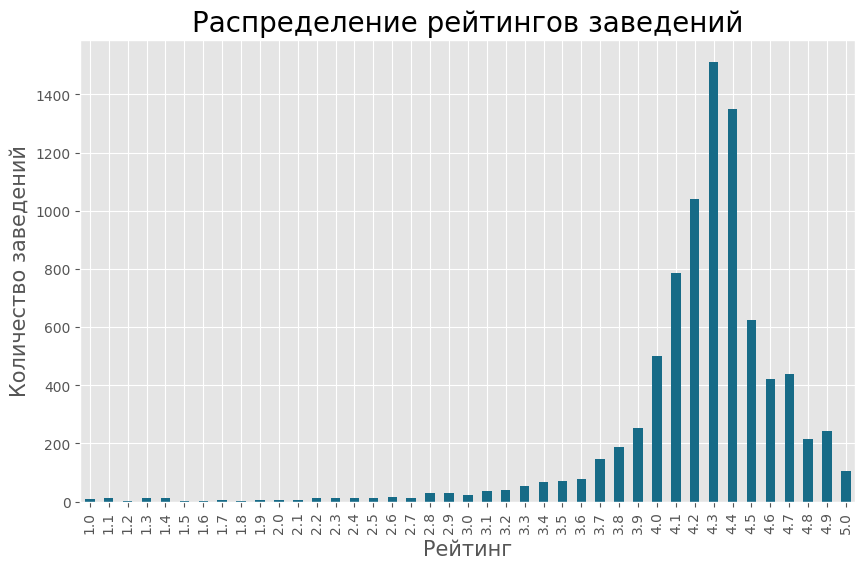

In [17]:
# строим диаграмму распределения рейтингов
plt.style.use('ggplot')
plt.figure(figsize=(10,6))
df.groupby('rating')['rating'].count().plot.bar(color='#176B87')
plt.title('Распределение рейтингов заведений', fontsize=20)
plt.xlabel('Рейтинг', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15);

<div style="background-color: #CCCCCC;">

Минимальной оценке 1.0 удостоено - 10 заведений, максимальной 5.0 - 105. Проблем с данными не выявлено. Распределение выглядит нормальным с пиком значений рейтинга 4.3.
</div>

### Обработка столбца price

Данные в столбце представляют собой категорию цен в заведении.

In [18]:
df['price'].isna().sum()

5091

В столбце 5091 пропуск. Некоторые пропуски возможно обработать на основе данных из столбца middle_avg_bill сгруппированных по категориям заведений. Для начала посмотрим на значения в столбце.

In [19]:
# посмотрим на значения столбца
df['price'].value_counts()

price
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: count, dtype: int64

В столбце price представленно 4 категории. Больше всего средних цен  - 2117 заведений, меньше всего низких - 156.<br>
В таблице много заведений по которым кроме рейтинга больше нет никакой информации. Найдём их количество.

In [20]:
df.loc[(df['price'].isna()) & \
       (df['avg_bill'].isna()) & \
       (df['middle_avg_bill'].isna()) & \
       (df['middle_coffee_cup'].isna()) & \
       (df['seats'].isna())] \
['name'].count()

2072

2072 заведений - это 25% от общего количества. Это очень много.<br>
Найдем медианные значения столбца middle_avg_bill по категориям цен и категориям заведений.

In [21]:
df_price = df.pivot_table(index=['price', 'category'], values='middle_avg_bill', aggfunc='median'). \
sort_values(by=['category', 'price']).reset_index()
df_price

,price,category,middle_avg_bill
0,высокие,"бар,паб",2000.0
1,выше среднего,"бар,паб",1250.0
2,низкие,"бар,паб",170.0
3,средние,"бар,паб",850.0
4,высокие,булочная,2500.0
5,выше среднего,булочная,1225.0
6,низкие,булочная,150.0
7,средние,булочная,442.5
8,высокие,быстрое питание,3200.0
9,выше среднего,быстрое питание,1250.0


Медианные значения у всех категорий заведений разные. Визуализируем распределение.

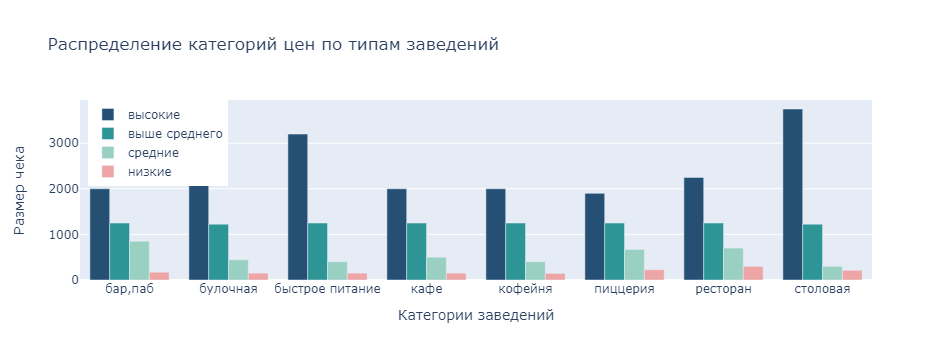

In [22]:
# создаем 4 отдельных списка с значениями по категориям цен из столбца price
y1=list(df_price[df_price['price'] == 'высокие']['middle_avg_bill'])
y2=list(df_price[df_price['price'] == 'выше среднего']['middle_avg_bill'])
y3=list(df_price[df_price['price'] == 'низкие']['middle_avg_bill'])
y4=list(df_price[df_price['price'] == 'средние']['middle_avg_bill'])

# создаем список с категориями заведений
x1=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']

# строим групповые столбчатые диаграммы
fig = go.Figure()
fig.add_trace(go.Bar(x = x1, y = y1, marker_color='#265073', name='высокие'))
fig.add_trace(go.Bar(x = x1, y = y2, marker_color='#2D9596', name='выше среднего'))
fig.add_trace(go.Bar(x = x1, y = y4, marker_color='#9AD0C2', name='средние'))
fig.add_trace(go.Bar(x = x1, y = y3, marker_color='#EEA5A6', name='низкие'))
fig.update_layout(legend_x=.01,
                  title='Распределение категорий цен по типам заведений',
                  xaxis_title='Категории заведений',
                  yaxis_title='Размер чека')

fig.show()

Найдем диапазоны столбца middle_avg_bill на основании которых будем заполнять пропуски в столбце price. Начнем с категории бар,паб.

In [23]:
df.loc[df['category'] == 'бар,паб']['middle_avg_bill'].describe()

count      349.000000
mean      1338.762178
std        885.669721
min        150.000000
25%        925.000000
50%       1250.000000
75%       1750.000000
max      11000.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории бар,паб:
- низкие - от 0 до 925;
- средние - от 926 до 1250;
- выше среднего - от 1251 до 1750;
- высокие - от 1751 и выше.

In [24]:
df['price'] = df['price'].fillna(0) # заменили NaN на 0 для удобства обработки

In [25]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'бар,паб') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 925):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'бар,паб') & (df.loc[i, 'price'] == 0) & (925 < (df.loc[i, 'middle_avg_bill']) <= 1250):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'бар,паб') & (df.loc[i, 'price'] == 0) & (1250 < df.loc[i, 'middle_avg_bill'] <= 1750):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'бар,паб') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 1750):
        df.loc[i, 'price'] = 'высокие'

Заменили пропуски в категории 'бар,паб'. Проверим, действительно ли это так.

In [26]:
df.query('category == "бар,паб" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Замена проведена успешно. Повторим процедуру для каждой категории заведений.

In [27]:
df.loc[df['category'] == 'булочная']['middle_avg_bill'].describe()

count      53.000000
mean      658.773585
std       599.468439
min        50.000000
25%       285.000000
50%       450.000000
75%       750.000000
max      2500.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории булочная:
- низкие - от 0 до 285;
- средние - от 286 до 450;
- выше среднего - от 451 до 750;
- высокие - от 751 и выше.

In [28]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'булочная') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 285):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'булочная') & (df.loc[i, 'price'] == 0) & (285 < (df.loc[i, 'middle_avg_bill']) <= 450):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'булочная') & (df.loc[i, 'price'] == 0) & (450 < df.loc[i, 'middle_avg_bill'] <= 750):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'булочная') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 750):
        df.loc[i, 'price'] = 'высокие'

In [29]:
df.query('category == "булочная" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории булочная.

In [30]:
df.loc[df['category'] == 'кафе']['middle_avg_bill'].describe()

count     694.000000
mean      707.753602
std       505.126951
min        67.000000
25%       350.000000
50%       550.000000
75%      1000.000000
max      4500.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории кафе:
- низкие - от 0 до 350;
- средние - от 351 до 550;
- выше среднего - от 551 до 1000;
- высокие - от 1001 и выше.

In [31]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'кафе') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 350):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'кафе') & (df.loc[i, 'price'] == 0) & (350 < (df.loc[i, 'middle_avg_bill']) <= 550):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'кафе') & (df.loc[i, 'price'] == 0) & (550 < df.loc[i, 'middle_avg_bill'] <= 1000):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'кафе') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 1000):
        df.loc[i, 'price'] = 'высокие'

In [32]:
df.query('category == "кафе" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории кафе.

In [33]:
df.loc[df['category'] == 'ресторан']['middle_avg_bill'].describe()

count     1040.000000
mean      1367.881731
std       1415.022183
min        120.000000
25%        668.750000
50%       1250.000000
75%       1750.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории ресторан:
- низкие - от 0 до 670;
- средние - от 671 до 1250;
- выше среднего - от 1251 до 1750;
- высокие - от 1751 и выше.

In [34]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'ресторан') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 670):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'ресторан') & (df.loc[i, 'price'] == 0) & (670 < (df.loc[i, 'middle_avg_bill']) <= 1250):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'ресторан') & (df.loc[i, 'price'] == 0) & (1250 < df.loc[i, 'middle_avg_bill'] <= 1750):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'ресторан') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 1750):
        df.loc[i, 'price'] = 'высокие'

In [35]:
df.query('category == "ресторан" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории ресторан.

In [36]:
df.loc[df['category'] == 'кофейня']['middle_avg_bill'].describe()

count     200.000000
mean      614.210000
std       501.083154
min         0.000000
25%       300.000000
50%       400.000000
75%       750.000000
max      2500.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории кофейня:
- низкие - от 0 до 300;
- средние - от 301 до 400;
- выше среднего - от 401 до 750;
- высокие - от 751 и выше.

In [37]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'кофейня') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 300):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'кофейня') & (df.loc[i, 'price'] == 0) & (300 < (df.loc[i, 'middle_avg_bill']) <= 400):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'кофейня') & (df.loc[i, 'price'] == 0) & (400 < df.loc[i, 'middle_avg_bill'] <= 750):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'кофейня') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 750):
        df.loc[i, 'price'] = 'высокие'

In [38]:
df.query('category == "кофейня" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории кофейня.

In [39]:
df.loc[df['category'] == 'пиццерия']['middle_avg_bill'].describe()

count     395.000000
mean      789.377215
std       518.310744
min       150.000000
25%       424.000000
50%       600.000000
75%      1000.000000
max      3000.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории пиццерия:
- низкие - от 0 до 424;
- средние - от 425 до 600;
- выше среднего - от 601 до 1000;
- высокие - от 1001 и выше.

In [40]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'пиццерия') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 424):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'пиццерия') & (df.loc[i, 'price'] == 0) & (424 < (df.loc[i, 'middle_avg_bill']) <= 600):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'пиццерия') & (df.loc[i, 'price'] == 0) & (600 < df.loc[i, 'middle_avg_bill'] <= 1000):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'пиццерия') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 1000):
        df.loc[i, 'price'] = 'высокие'

In [41]:
df.query('category == "пиццерия" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории пиццерия.

In [42]:
df.loc[df['category'] == 'быстрое питание']['middle_avg_bill'].describe()

count     237.000000
mean      445.763713
std       456.092666
min        30.000000
25%       275.000000
50%       375.000000
75%       500.000000
max      5500.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории быстрое питание:
- низкие - от 0 до 275;
- средние - от 276 до 375;
- выше среднего - от 376 до 500;
- высокие - от 500 и выше.

In [43]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'быстрое питание') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 275):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'быстрое питание') & (df.loc[i, 'price'] == 0) & (275 < (df.loc[i, 'middle_avg_bill']) <= 375):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'быстрое питание') & (df.loc[i, 'price'] == 0) & (375 < df.loc[i, 'middle_avg_bill'] <= 500):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'быстрое питание') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 500):
        df.loc[i, 'price'] = 'высокие'

In [44]:
df.query('category == "быстрое питание" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории быстрое питание.

In [45]:
df.loc[df['category'] == 'столовая']['middle_avg_bill'].describe()

count     181.000000
mean      335.348066
std       289.213253
min       125.000000
25%       250.000000
50%       300.000000
75%       330.000000
max      3750.000000
Name: middle_avg_bill, dtype: float64

По значениям процентилей определяем диапазоны для категории столовая:
- низкие - от 0 до 250;
- средние - от 251 до 300;
- выше среднего - от 301 до 330;
- высокие - от 331 и выше.

In [46]:
for i in range(len(df)):
    if (df.loc[i, 'category'] == 'столовая') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] <= 250):
        df.loc[i, 'price'] = 'низкие'
    elif (df.loc[i, 'category'] == 'столовая') & (df.loc[i, 'price'] == 0) & (250 < (df.loc[i, 'middle_avg_bill']) <= 300):
        df.loc[i, 'price'] = 'средние'
    elif (df.loc[i, 'category'] == 'столовая') & (df.loc[i, 'price'] == 0) & (300 < df.loc[i, 'middle_avg_bill'] <= 330):
        df.loc[i, 'price'] = 'выше среднего'
    elif (df.loc[i, 'category'] == 'столовая') & (df.loc[i, 'price'] == 0) & (df.loc[i, 'middle_avg_bill'] > 330):
        df.loc[i, 'price'] = 'высокие'

In [47]:
df.query('category == "столовая" & price == 0 & ~middle_avg_bill.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Провели замену для категории столовая.<br> 
Провели замену всех возможных пропусков в столбце price на основе внутригрупповых значений. Посмотрим на количество пропусков после замены.

In [48]:
df.query('price == 0')['price'].count()

4621

До обработки было 5091 пропуск. Итого обработали 470 пропусков в столбце price.

In [49]:
df['price'] = df['price'].replace(0, np.nan) # вернули в исходное состояние, заменили 0 на NaN 
df['price'].value_counts()

price
средние          2266
выше среднего     637
высокие           529
низкие            353
Name: count, dtype: int64

<div style="background-color: #CCCCCC;">

После обработки значения изменились, но картина в целом не поменялась, больше всего заведений с категориями цен - средние, меньше всего - низкие.
</div>

### Обработка столбца avg_bill

Данные в столбце представляют собой среднюю стоимость заказа в виде диапазона.

In [50]:
df['avg_bill'].isna().sum()

4590

В столбце 4590 пропусков. Посмотрим на значения.

In [51]:
df['avg_bill'].sort_values().nunique()

897

In [52]:
df['avg_bill'].sort_values().unique().tolist()

['Средний счёт:100 ₽',
 'Средний счёт:1000 ₽',
 'Средний счёт:1000–10000 ₽',
 'Средний счёт:1000–1100 ₽',
 'Средний счёт:1000–1200 ₽',
 'Средний счёт:1000–1300 ₽',
 'Средний счёт:1000–1350 ₽',
 'Средний счёт:1000–1400 ₽',
 'Средний счёт:1000–1500 ₽',
 'Средний счёт:1000–1600 ₽',
 'Средний счёт:1000–1700 ₽',
 'Средний счёт:1000–2000 ₽',
 'Средний счёт:1000–2500 ₽',
 'Средний счёт:1000–3000 ₽',
 'Средний счёт:1000–5000 ₽',
 'Средний счёт:100–1000 ₽',
 'Средний счёт:100–160 ₽',
 'Средний счёт:100–180 ₽',
 'Средний счёт:100–200 ₽',
 'Средний счёт:100–2000 ₽',
 'Средний счёт:100–270 ₽',
 'Средний счёт:100–300 ₽',
 'Средний счёт:100–330 ₽',
 'Средний счёт:100–350 ₽',
 'Средний счёт:100–400 ₽',
 'Средний счёт:100–423 ₽',
 'Средний счёт:100–500 ₽',
 'Средний счёт:100–599 ₽',
 'Средний счёт:100–700 ₽',
 'Средний счёт:1100–1500 ₽',
 'Средний счёт:110–200 ₽',
 'Средний счёт:120 ₽',
 'Средний счёт:1200 ₽',
 'Средний счёт:1200–1300 ₽',
 'Средний счёт:1200–1500 ₽',
 'Средний счёт:1200–1600 ₽',
 'Сре

<div style="background-color: #CCCCCC;">

897 уникальных значений. Можно выделить три больших группы: средний счет, цена бокала пива, цена чашки капучино.<br>
Данные из столбца в нашем исследовании использоваться не будут, обрабатывать не будем.
</div>

### Обработка столбца middle_avg_bill

Данные в столбце представляют собой число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».

In [53]:
df['middle_avg_bill'].isna().sum()

5257

В столбце 4621 пропуск. Посмотрим на значения.

In [54]:
df['middle_avg_bill'].value_counts().reset_index().sort_values(by='middle_avg_bill').reset_index(drop=True).head()

,middle_avg_bill,count
0,0.0,1
1,30.0,1
2,50.0,4
3,67.0,1
4,90.0,1


230 уникальных значений, от 0 до 35 000. Значение 0 скорее всего аномалия. Заменим его на NaN.

In [55]:
df['middle_avg_bill'] = df['middle_avg_bill'].replace(0, np.nan)
df['middle_avg_bill'].value_counts().reset_index().sort_values(by='middle_avg_bill').reset_index(drop=True).head()

,middle_avg_bill,count
0,30.0,1
1,50.0,4
2,67.0,1
3,90.0,1
4,100.0,4


Заполнить пропуски не представляется возможным. 

### Обработка столбца middle_coffee_cup

Данные в столбце представляют собой число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».

In [56]:
df['middle_coffee_cup'].isna().sum()

7871

В столбце 7871 пропуск, но мы знаем, что данные в нем для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».

In [57]:
# посмотрим на значения столбца
df['middle_coffee_cup'].value_counts().reset_index().sort_values(by='middle_coffee_cup').reset_index(drop=True).head()

,middle_coffee_cup,count
0,60.0,33
1,75.0,2
2,79.0,3
3,80.0,5
4,84.0,1


В столбце 96 уникальных значений, от 60 до 1568. Значение 1568 выглядит аномально. Посмотрим на эту строку.

In [58]:
df.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


На лицо явная ошибка "оператора". В столбце avg_bill в диапазоне цен ошибка в значении 2907, цифра 7 здесь лишняя. Поэтому и значение в столбце middle_coffee_cup - 1568. Обработаем его и заменим на среднее между 230 и 290 - это 260.

In [59]:
df['middle_coffee_cup'] = df['middle_coffee_cup'].replace(1568.0, 260.0)
df.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Замена прошла успешно.

### Обработка столбца chain

Данные в столбце представляют собой булево значение, которое отражает является ли заведение сетевым или нет.<br>
Пропусков в столбце не обнаружено. Посмотрим на значения.

In [60]:
df['chain'].value_counts()

chain
0    5201
1    3205
Name: count, dtype: int64

В нашей выборке 3205 сетевых заведения и 5201 не сетевых.

### Обработка столбца seats

Данные в столбце представляют собой количество посадочных мест.

In [61]:
df['seats'].isna().sum()

3611

В столбце 3611 пропуска. Посмотрим на значения.

In [62]:
df['seats'].value_counts().reset_index().sort_values(by='seats').reset_index(drop=True)

,seats,count
0,0.0,136
1,1.0,4
2,2.0,15
3,3.0,13
4,4.0,25
...,...,...
224,760.0,1
225,920.0,2
226,1040.0,4
227,1200.0,1


229 уникальных значений, от 0 до 1288 посадочных мест. Трудно представить себе булочную или кофейню на 200 посадочных мест, поэтому такие значения выглядят аномально.<br>
Яндекс Карты и информация из официальных сайтов, также не подтвердили данные о количестве посадочных мест в нашей выборке. По многим заведениям информация вообще отсутствует. Ошибка возникла скорее всего по техническим причинам.<br>
Значения которые равны 200 и более разделим на 10.

In [63]:
df.loc[df['seats'] >= 200, 'seats'] = df.loc[df['seats'] >= 200, 'seats'] / 10

In [64]:
df['seats'] = round(df['seats']) # округляем значения после деления на 10

In [65]:
df['seats'].value_counts().reset_index().sort_values(by='seats').reset_index(drop=True)

,seats,count
0,0.0,136
1,1.0,4
2,2.0,15
3,3.0,13
4,4.0,25
...,...,...
154,189.0,6
155,190.0,31
156,192.0,2
157,195.0,2


После обработки получилось уже 159 уникальных значений от 0 до 198 посадочных мест.

<div style="background-color: #CCCCCC;">

**Выводы:**<br>
Провели предобработку исходных данных, а также изучили содержание каждого столбца.<br>
Явных дубликатов не обнаружено. Часть пропусков удалось обработать только в столбце price на основе медианных значений middle_avg_bill сгрупированных по столбцу category.<br>
В нашей выборке 5614 различных названий заведений. Присутствуют обезличенные названия заведений, такие как: Кафе, Шаурма, Чайхана, Ресторан, Столовая.<br>
В столбце category представлено всего 8 типов заведений: кафе, ресторан, кофейня, бар паб, пиццерия, быстрое питание, столовая, булочная. Подавляющее большинство заведений в трёх категориях - кафе, ресторан и кофейня.<br>
В столбце address 5753 - адресов по которым расположены заведения в Москве. 2653 дубликата говорит о том, что по одному адресу расположено не одно заведение. Есть такие места в которых расположены более 20 заведений общественного питания.<br>
Здесь напрашивается одна мысль. Казалось бы, такое количество заведений расположенных в одном месте, говорит о большой конкуренции, а следовательно и небольшому стартапу там не выдержать этой конкуренции. Но с другой стороны может быть именно поэтому там такое количество заведений, потому что именно там большая проходимость, потому что именно за этим туда приходят посетители - за разнообразием. Стоит изучить подробнее такие адреса для возможных предложений по размещению кофейни для инвесторов.<br>
В выборке представлено 9 административных районов Москвы. Лидером по количеству является Центральный административный округ - 2242 заведения, меньше всего в Северо-Западном административном округе - всего 409 заведений.<br>
Рейтинги выглядят следующим образом, минимальный - 1.0 имеет 10 заведений, максимальной 5.0 - 105 заведений. Максимальное количество заведений расположено в диапазоне рейтинга 4.0 - 4.7.<br>
Пропуски из столбца avg_bill не обрабатываем, так как данные из него в нашем исследовании использоваться не будут. Данные являются дополнительными к основным.<br>
Заполнить пропуски в столбцах middle_avg_bill и middle_coffee_cup не представляется возможным, так как данные в них используются для значений из столбца avg_bill.<br>
В нашей выборке 3205 сетевых заведения и 5201 не сетевых.<br>
Посадочные места представляли значения от 0 до 1288. Яндекс Карты и информация из официальных сайтов, также не подтвердили данные о количестве посадочных мест в нашей выборке. По многим заведениям информация вообще отсутствует.Трудно представить себе булочную или кофейню на 200 посадочных мест, поэтому такие значения выглядят аномально. Значения от 200 и более мы разделили на 10.<br>

Ошибка могли возникнуть по следующим причинам:<br>
- по техническим - сбой при формировании исходных данных;
- человеческий фактор - при вводе информации пользователями были введены недостоверные или ошибочные данные.
</div>

## Добавление новых столбцов

Создадим функцию, которая разделяет строку и создает новый фрейм из полученных значений.

In [66]:
def all_value(data):
    return data.str.split(', ', expand=True)

С помощью нашей функции создадим новый столбец street.

In [67]:
street = all_value(df['address'])
df['street'] = street[1]

Создадим ещё один столбец is_24_7.

In [68]:
# создаём цикл с помощью которого перебираем значения столбца hours и добавляем в список 0 или 1
a = []
for i in range(len(df['hours'])):
    if df.loc[i, 'hours'] == 'ежедневно, круглосуточно':
        a.append(True)
    else: 
        a.append(False)

In [69]:
# создаем необходимый столбец и присваиваем ему значения списка а
df['is_24_7'] = a
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [70]:
df['is_24_7'].value_counts()

is_24_7
False    7676
True      730
Name: count, dtype: int64

Новые столбцы успешно добавлены.

<div style="background-color: #CCCCCC;">

**Вывод:**<br>
Добавили новые столбцы street и is_24_7. Выяснили, что круглосуточных заведений в Москве не так уж и много, всего 730. А хороших, так вообще наверно по пальцам пересчитать. Теперь можем приступать к проведению основного исследования.
</div>

## Исследовательский анализ

Частично мы уже ответили на некоторые вопросы нашего исследования. Еще раз посмотрим на категории заведений представленные в нашей выборке.

### Анализ категорий заведений

In [71]:
df_category = df['category'].value_counts().reset_index()
df_category.columns = ['category', 'count']
df_category

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


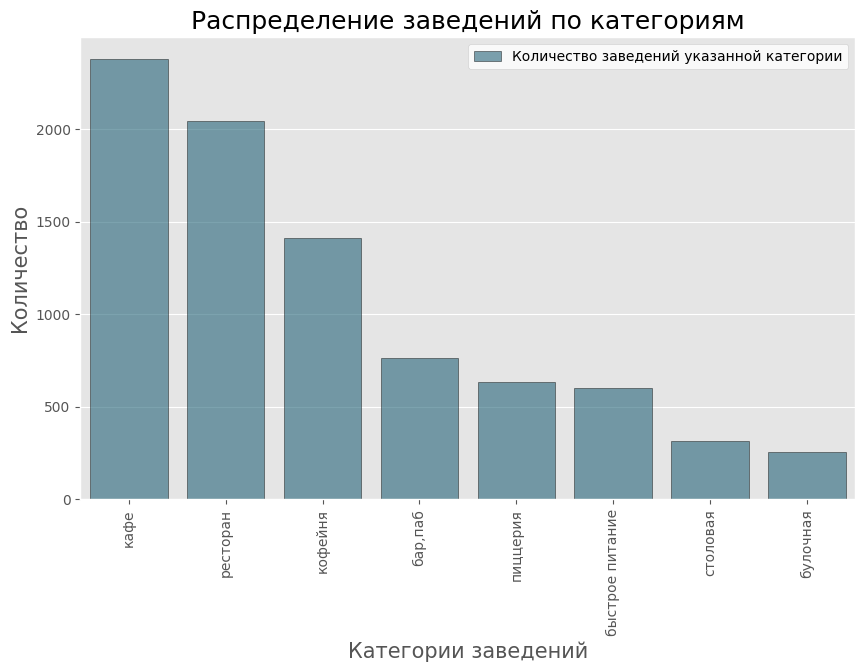

In [72]:
# строим столбчатую диаграмму
plt.figure(figsize=(10,6))
sns.barplot(x='category', y='count', \
            data=df_category, \
            color = '#176B87', \
            alpha=0.6, \
            edgecolor = 'black',\
            label='Количество заведений указанной категории')
plt.xticks(rotation=90)
plt.legend(facecolor='white')
plt.title('Распределение заведений по категориям', fontsize=18)
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Количество', fontsize=15);

<div style="background-color: #CCCCCC;">

В нашей выборке представлены следующие категории заведений: кафе, ресторан, кофейня, бар и паб, пиццерия, быстрое питание, столовая, булочная. Больше всего представлено кафе - 2378, ресторанов - 2043 и кофеин - 1413. Меньше всех - столовых - 315 и булочных - 256.
</div>

### Анализ посадочных мест по категориям заведений

#### Кафе

Посмотрим на значения посадочных мест в категории кафе.

In [73]:
df.loc[df['category'] == 'кафе', 'seats'].value_counts().head(10)

seats
40.0     80
50.0     69
20.0     67
100.0    53
60.0     46
0.0      44
30.0     44
45.0     43
80.0     42
120.0    36
Name: count, dtype: int64

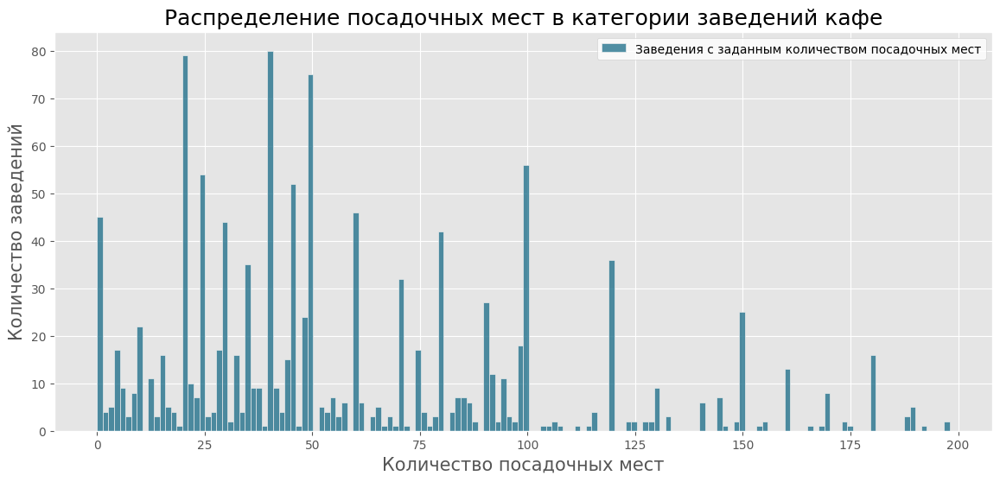

In [74]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "кафе"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений кафе', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории кафе. Больше всего заведений cо следующим количеством мест: 40, 50 и 20 мест. Есть заведения без своих посадочных мест - 44 заведения.
</div>

#### Pесторан

Посмотрим на значения посадочных мест в категории ресторан.

In [75]:
df.loc[df['category'] == 'ресторан', 'seats'].value_counts().head(10)

seats
100.0    72
40.0     67
50.0     48
20.0     48
70.0     48
30.0     47
80.0     47
150.0    42
60.0     40
48.0     38
Name: count, dtype: int64

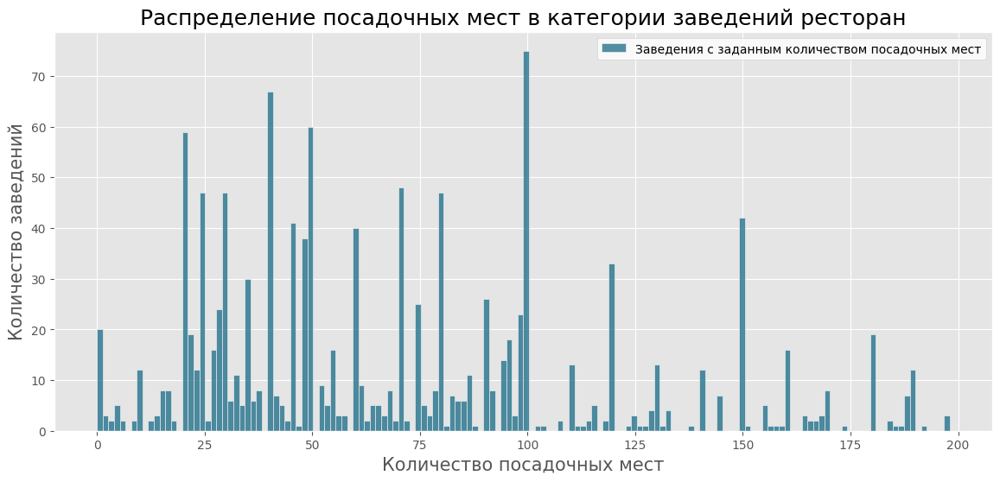

In [76]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "ресторан"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений ресторан', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории ресторан. Больше всего заведений cо следующим количеством мест: 100 и 40 мест. Есть заведения без своих посадочных мест - 20 заведений.
</div>

#### Кофейня

Посмотрим на значения посадочных мест в категории кофейня.

In [77]:
df.loc[df['category'] == 'кофейня', 'seats'].value_counts().head(10)

seats
100.0    36
20.0     34
30.0     33
40.0     27
120.0    25
80.0     25
0.0      24
50.0     23
150.0    20
60.0     20
Name: count, dtype: int64

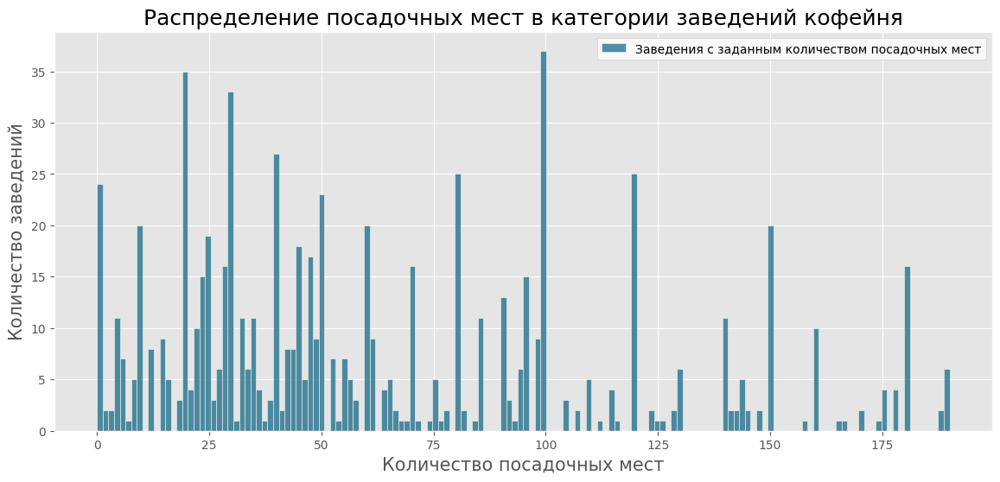

In [78]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "кофейня"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений кофейня', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории кофейня. Больше всего заведений cо следующим количеством мест: 100, 20 и 30 мест. Есть заведения без своих посадочных мест - 24 заведения.
</div>

####  Бар, паб

Посмотрим на значения посадочных мест в категории бар, паб.

In [79]:
df.loc[df['category'] == 'бар,паб', 'seats'].value_counts().head(10)

seats
60.0     31
40.0     30
30.0     23
20.0     22
120.0    20
100.0    18
90.0     18
50.0     17
80.0     17
48.0     16
Name: count, dtype: int64

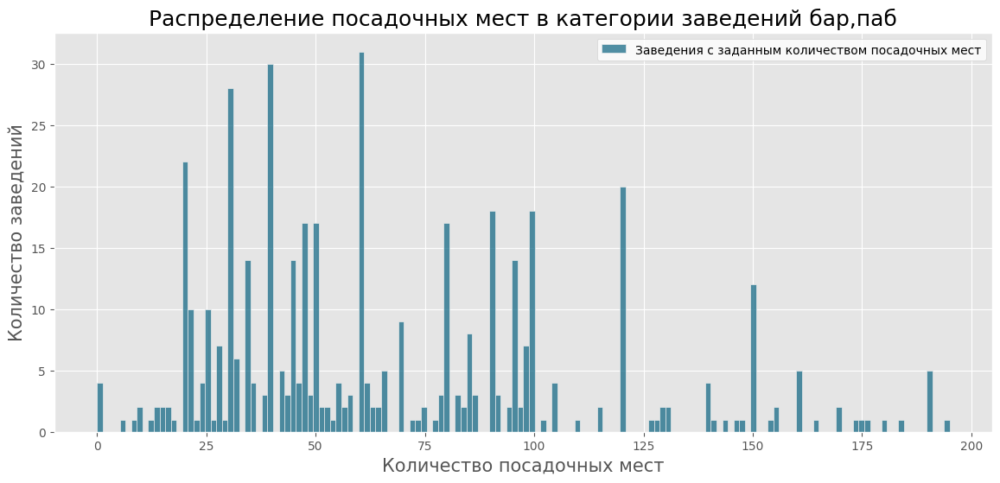

In [80]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "бар,паб"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений бар,паб', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории бар, паб. Больше всего заведений cо следующим количеством мест: 60 и 40 мест. Есть заведения без своих посадочных мест - 4 заведения.
</div>

#### Пиццерия

Посмотрим на значения посадочных мест в категории пиццерия.

In [81]:
df.loc[df['category'] == 'пиццерия', 'seats'].value_counts().head(10)

seats
20.0    27
40.0    25
30.0    24
60.0    18
50.0    16
45.0    14
25.0    12
24.0    12
80.0    12
70.0    11
Name: count, dtype: int64

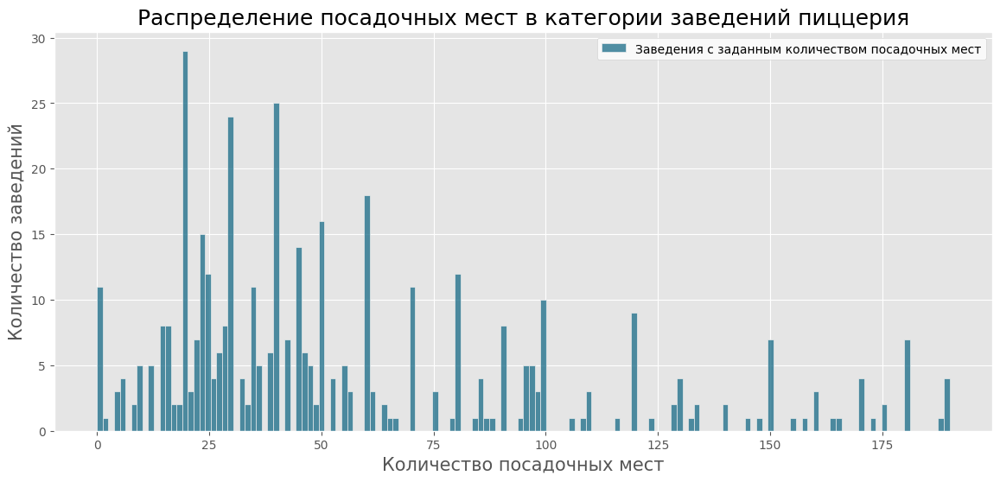

In [82]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "пиццерия"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений пиццерия', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории пиццерия. Больше всего заведений cо следующим количеством мест: 20, 40 и 30  мест. Есть заведения без своих посадочных мест - 10 заведений.
</div>

#### Быстрое питание

Посмотрим на значения посадочных мест в категории быстрое питание.

In [83]:
df.loc[df['category'] == 'быстрое питание', 'seats'].value_counts().head(10)

seats
0.0      18
40.0     17
10.0     15
100.0    15
20.0     14
30.0     12
160.0    11
60.0     11
35.0     10
45.0     10
Name: count, dtype: int64

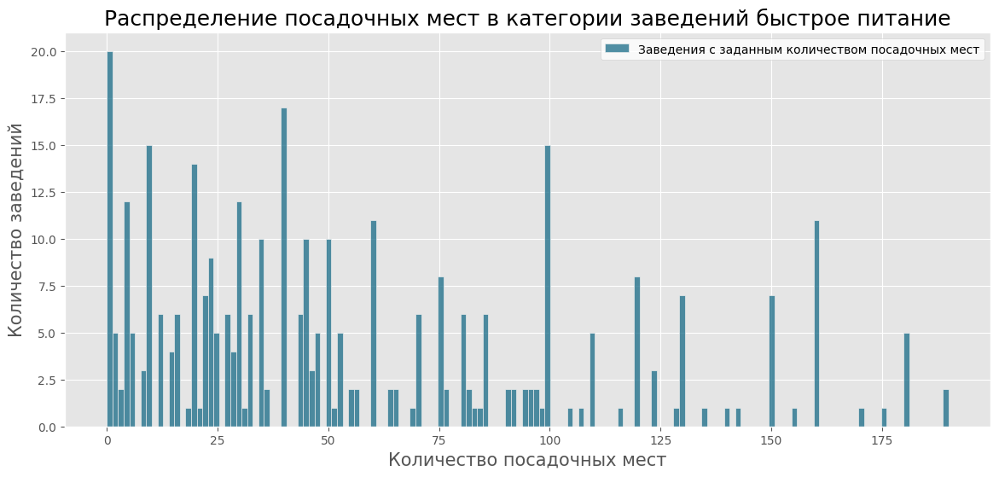

In [84]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "быстрое питание"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений быстрое питание', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории быстрое питание. Больше всего заведений cо следующим количеством мест: 0, 40, 10 и 100 мест. В этой категории заведения без посадочных мест оказались лидерами. Это особенность этой категории заведения. Категория "быстрое питание" говорит сама за себя, зачем садится за стол, когда нужно быстро поесть и дальше заниматься своими делами.
</div>

#### Столовая

Посмотрим на значения посадочных мест в категории столовая.

In [85]:
df.loc[df['category'] == 'столовая', 'seats'].value_counts().head(10)

seats
40.0     16
80.0     10
60.0      9
120.0     7
20.0      7
30.0      7
100.0     6
50.0      6
0.0       5
150.0     5
Name: count, dtype: int64

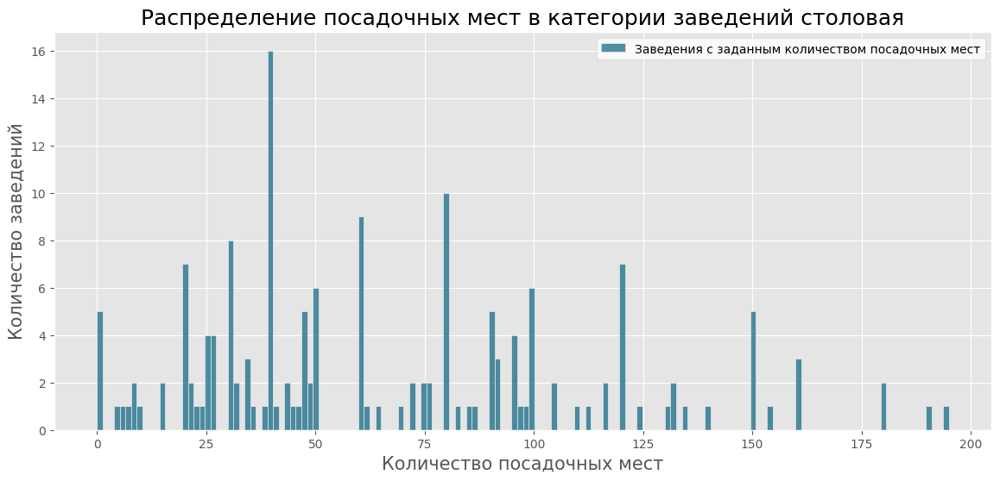

In [86]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "столовая"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений столовая', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории столовая. Больше всего заведений cо следующим количеством мест: 40 и 80 мест. Есть заведения без своих посадочных мест - 5 заведений.
</div>

#### Булочная

Посмотрим на значения посадочных мест в категории булочная.

In [87]:
df.loc[df['category'] == 'булочная', 'seats'].value_counts().head(10)

seats
0.0      11
20.0      9
48.0      7
50.0      6
30.0      6
24.0      5
150.0     5
90.0      5
40.0      4
35.0      4
Name: count, dtype: int64

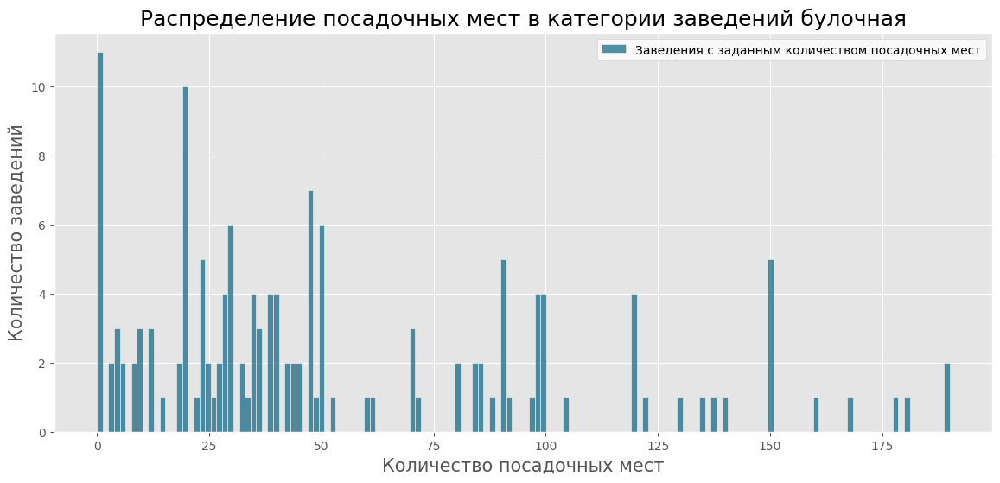

In [88]:
# строим гистограмму
plt.figure(figsize=(14,6))
sns.histplot(x='seats', bins=150, data=df.query('category == "булочная"'), \
             color='#176B87', \
             label='Заведения с заданным количеством посадочных мест')
plt.legend(facecolor='white')
plt.xlabel('Количество посадочных мест', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Распределение посадочных мест в категории заведений булочная', fontsize=18);

<div style="background-color: #CCCCCC;">

Построили гистограмму распределения посадочных мест в категории булочная. Больше всего заведений cо следующим количеством мест: 0 и 20 мест. В этой категории также лидером оказались заведения без посадочных мест. В булочную, в принципе, ходят за выпечкой, но в некоторых заведениях её сразу можно попробовать с комфортом.
</div>

<div style="background-color: #CCCCCC;">

**Выводы:**<br>
Анализ посадочных мест по категориям заведений показал следующее:
- заведения с самым большим количеством посадочных мест в категориях ресторан и кофейня - 100 мест;
- категории заведения в которых от 40 до 60 мест - кафе, бары и пабы, столовые;
- заведения в которых в основном нет посадочных мест в категориях быстрое питание и булочная;
- заведения с самым маленьким количеством посадочных мест - пиццерия - 20 мест.

В каждой категории присутствуют заведения без посадочных мест. Это скорее всего связано с наличием общей фуд зоны в крупных торговых центрах, а также с особенностями самих заведений.
</div>

### Анализ сетевых заведений

Проведем анализ сетевых заведений в целом и по категориям.

In [89]:
# создадим выборку с количеством сетевых и несетвых заведений
df_chain = df['chain'].value_counts().reset_index()
df_chain.columns = ['chain', 'count']
ch = ['Несетевые', 'Сетевые'] # определим более понятные значения
df_chain['chain'] = ch
df_chain

,chain,count
0,Несетевые,5201
1,Сетевые,3205


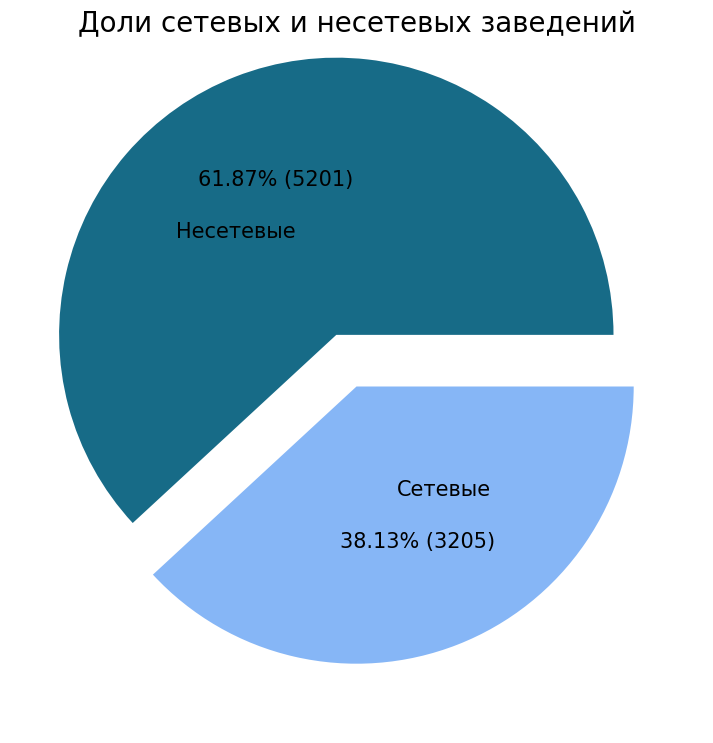

In [90]:
plt.figure(figsize=(9,9))
explode = (0.2, 0)
plt.pie(df_chain['count'], labels=df_chain['chain'], colors=['#176B87', '#86B6F6'], \
        explode=explode, \
        textprops = {"fontsize":15}, \
        labeldistance=0.4, \
        autopct=lambda p: '{:.2f}% ({:.0f})'.format(p,(p/100)*sum(df_chain['count'])))
plt.title('Доли сетевых и несетевых заведений', fontsize=20);

В нашей выборке из 8406 заведений 3205 являются сетевыми, что составляет 38%.

In [91]:
# сгруппируем исходную быборку df по категориям и посчитаем количество сетевых заведений в каждой
df_chain_group = df.groupby('category')['chain'].sum().sort_values(ascending=False).reset_index()
df_chain_group.columns = ['category', 'count']
df_chain_group

,category,count
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


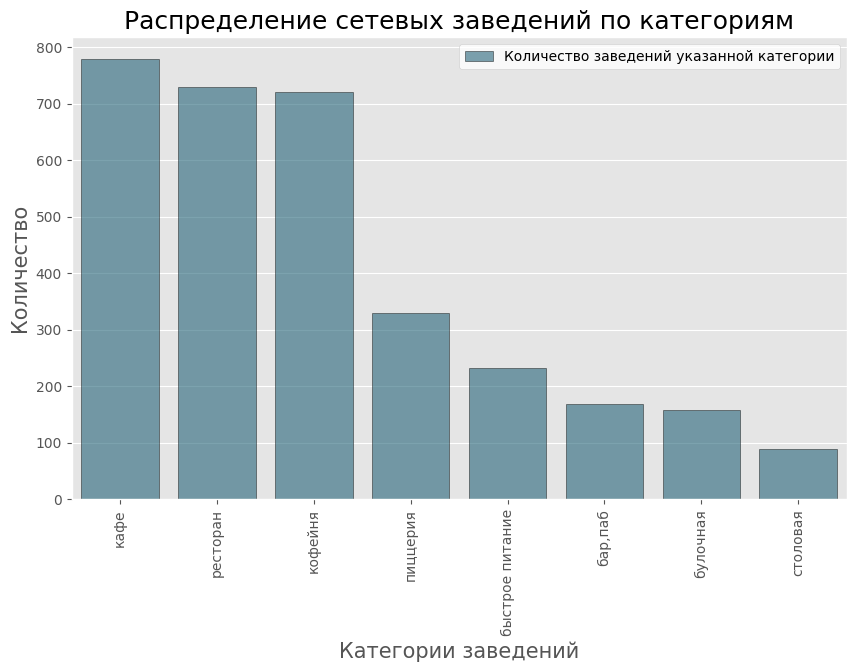

In [92]:
# строим столбчатую диаграмму
plt.figure(figsize=(10,6))
sns.barplot(x='category', y='count', \
            data=df_chain_group, \
            color = '#176B87', \
            alpha=0.6, \
            edgecolor = 'black',\
            label='Количество заведений указанной категории')
plt.xticks(rotation=90)
plt.legend(facecolor='white')
plt.title('Распределение сетевых заведений по категориям', fontsize=18)
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Количество', fontsize=15);

Больше всего сетевых заведений представлено в категории кафе, ресторан и кофейня. Что логично, ведь это самые многочисленные категории. Посмотрим на абсолютные величины. Для этого соединим две таблицы: с общим количеством по категориям и количеством сетевых заведений по категориям.

In [93]:
# соединяем две таблицы
df_chain_category = df_category.merge(df_chain_group, on='category')
df_chain_category.columns = ['category', 'count', 'count_chain']

# создаем новый столбец с долями от общего количества
df_chain_category['part_chain'] = round((df_chain_category['count_chain'] / df_chain_category['count']) * 100, 2)
df_chain_category.sort_values(by='part_chain', ascending=False)

,category,count,count_chain,part_chain
7,булочная,256,157,61.33
4,пиццерия,633,330,52.13
2,кофейня,1413,720,50.96
5,быстрое питание,603,232,38.47
1,ресторан,2043,730,35.73
0,кафе,2378,779,32.76
6,столовая,315,88,27.94
3,"бар,паб",765,169,22.09


В абсолютных величинах картина меняется в корне. Больше всего булочных и пиццерий, но есть категория которая попала в тройку и здесь - это кофейни.

### Топ-15 популярных сетей заведений в Москве

Посмотрим на самые крупные сетевые заведения Москвы.

In [94]:
# сгруппируем заведения по названию, отсортируем по убыванию и оставим 15 строк
df_top = df.query('chain == 1').pivot_table(index='name', values='category', aggfunc=['first', 'count']).reset_index() 
df_top.columns = ['name', 'category', 'count'] 
df_top = df_top.sort_values(by='count', ascending=False).reset_index(drop=True).head(15)
df_top

,name,category,count
0,Шоколадница,кофейня,120
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,50
7,Хинкальная,быстрое питание,44
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


Нашли топ-15 популярных сетей в Москве. В топ вошли следующие категории:
- кофейня - 5;
- ресторан - 3;
- кафе - 3;
- пиццерия - 2;
- быстрое питание - 1;
- булочная - 1.

Абсолютным лидером является сеть кофеин Шоколадница - 120 заведений. Далее идут две пиццерии Домино'с Пицца - 76 заведений и Додо Пицца - 74 заведений. Визуализируем для наглядности.

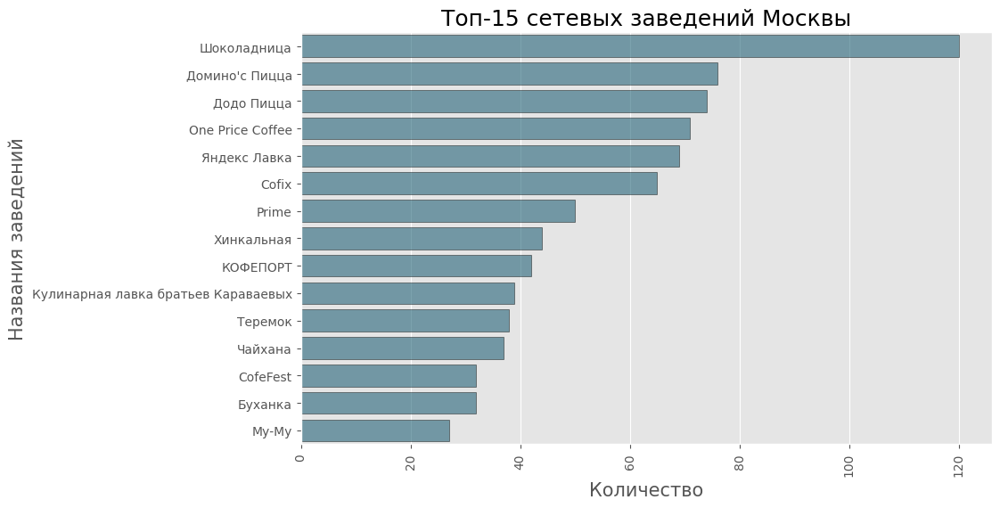

In [95]:
# строим столбчатую диаграмму
plt.figure(figsize=(10,6))
sns.barplot(x='count', y='name', \
            data=df_top, \
            orientation='horizontal', \
            color = '#176B87', \
            alpha=0.6, \
            edgecolor = 'black')
plt.xticks(rotation=90)
plt.title('Топ-15 сетевых заведений Москвы', fontsize=18)
plt.xlabel('Количество', fontsize=15)
plt.ylabel('Названия заведений', fontsize=15);

### Анализ заведений по административным районам Москвы

In [96]:
df_district = df.pivot_table(index=['district', 'category'], values='name', aggfunc='count').reset_index()
df_district.head()

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105


In [97]:
# найдем общее количество заведений по районам
df_district_total = df.groupby('district')['name'].count().reset_index()
df_district_total

,district,name
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [98]:
# соединяем две таблицы
df_district_total_all = df_district.merge(df_district_total, on='district')
df_district_total_all.columns = ['district', 'category', 'count', 'count_total']

# находим доли заведений от общего количества по округам и сохраняем в новый столбец
df_district_total_all['part_count'] = round((df_district_total_all['count'] / df_district_total_all['count_total']) * 100, 1)
df_district_total_all.head(10)

,district,category,count,count_total,part_count
0,Восточный административный округ,"бар,паб",53,798,6.6
1,Восточный административный округ,булочная,25,798,3.1
2,Восточный административный округ,быстрое питание,71,798,8.9
3,Восточный административный округ,кафе,272,798,34.1
4,Восточный административный округ,кофейня,105,798,13.2
5,Восточный административный округ,пиццерия,72,798,9.0
6,Восточный административный округ,ресторан,160,798,20.1
7,Восточный административный округ,столовая,40,798,5.0
8,Западный административный округ,"бар,паб",50,851,5.9
9,Западный административный округ,булочная,37,851,4.3


In [99]:
# заменяем длинные названия на короткие абревиатуры
df_district_total_all['district'] = ['ВАО'] * 8 + ['ЗАО'] * 8 + ['САО'] * 8 + ['СВАО'] * 8 + ['СЗАО'] * 8 + ['ЦАО'] * 8 + ['ЮВАО'] * 8 + ['ЮЗАО'] * 8 + ['ЮАО'] * 8
df_district_total_all.head()

,district,category,count,count_total,part_count
0,ВАО,"бар,паб",53,798,6.6
1,ВАО,булочная,25,798,3.1
2,ВАО,быстрое питание,71,798,8.9
3,ВАО,кафе,272,798,34.1
4,ВАО,кофейня,105,798,13.2


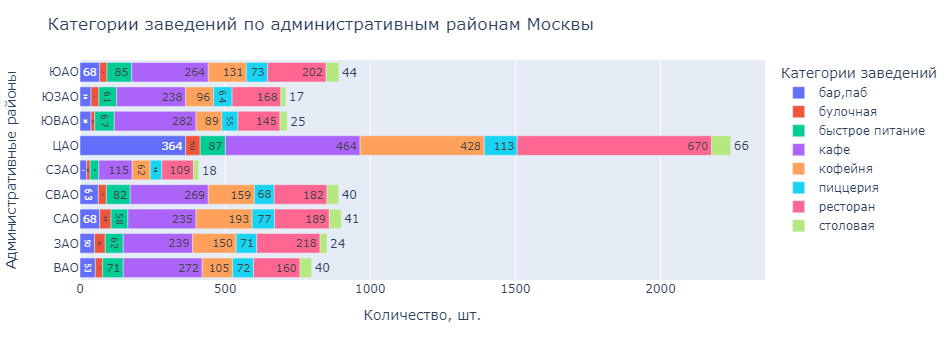

In [100]:
fig = px.bar(df_district_total_all, x='count', y='district', color='category', text='count', orientation='h')
fig.update_layout(title='Категории заведений по административным районам Москвы',
                 xaxis_title='Количество, шт.',
                 yaxis_title='Административные районы',
                 legend_title='Категории заведений')
fig.show()

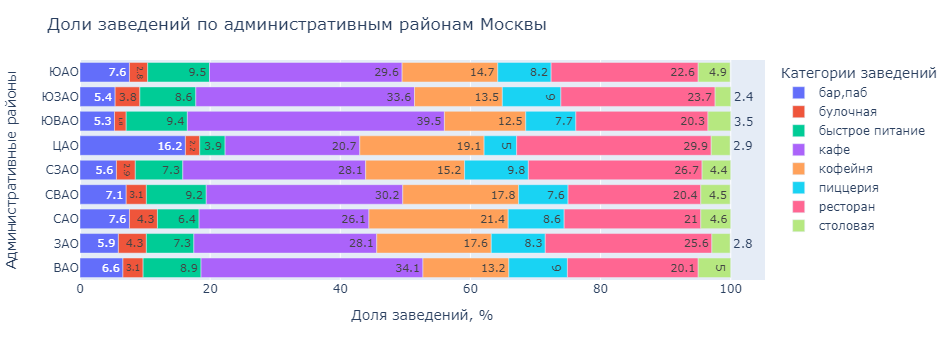

In [101]:
fig = px.bar(df_district_total_all, x='part_count', y='district', color='category', text='part_count', orientation='h')
fig.update_layout(title='Доли заведений по административным районам Москвы',
                 xaxis_title='Доля заведений, %',
                 yaxis_title='Административные районы',
                 legend_title='Категории заведений')
fig.show()

<div style="background-color: #CCCCCC;">

Всего представлено 9 административных районов Москвы. Лидером по количеству является Центральный административный округ - 2242 заведения, причем по всем категориям, за исключением быстрого питания, которое относительно равномерно представлено во всех административных районах. Меньше всего заведений в Северо-Западном административном округе - 409.
</div>

### Анализ средних рейтингов по категориям заведений

In [102]:
# группируем по категориям и находим средний рейтинг
df_category_rating = round(df.groupby('category', as_index=False)['rating'].mean(), 2).sort_values(by='rating').reset_index(drop=True)
df_category_rating

,category,rating
0,быстрое питание,4.05
1,кафе,4.12
2,столовая,4.21
3,булочная,4.27
4,кофейня,4.28
5,ресторан,4.29
6,пиццерия,4.30
7,"бар,паб",4.39


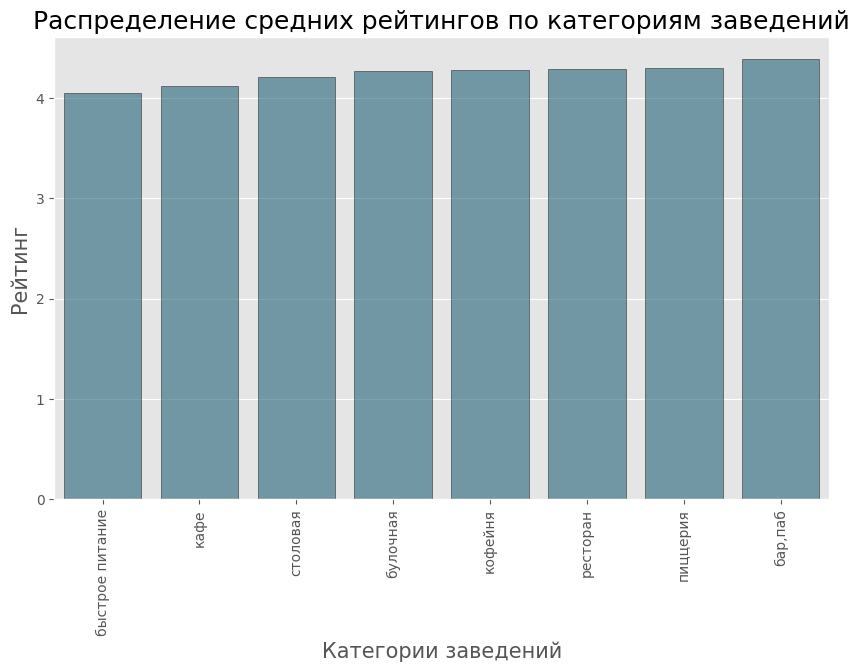

In [103]:
# строим столбчатую диаграмму
plt.figure(figsize=(10,6))
sns.barplot(x='category', y='rating', \
            data=df_category_rating, \
            color = '#176B87', \
            alpha=0.6, \
            edgecolor = 'black')
plt.xticks(rotation=90)
plt.title('Распределение средних рейтингов по категориям заведений', fontsize=18)
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Рейтинг', fontsize=15);

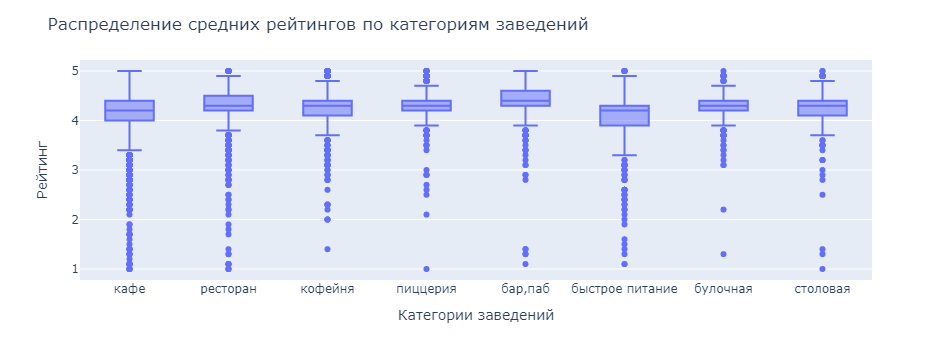

In [104]:
# строим ящик с усами
fig = px.box(df, x='category', y='rating')

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                 xaxis_title='Категории заведений',
                 yaxis_title='Рейтинг',
                 legend_title='Категории заведений')
fig.show()

<div style="background-color: #CCCCCC;">

В целом средние рейтинги одинаковые в каждой категории заведений и находятся в диапазоне 4.2 - 4.4. Самый высокий 4.4 - бары и пабы, низкий 4.2 - быстрое питание и кафе.
</div>

### Анализ рейтингов заведений по административным районам

In [105]:
# группируем данные по районам и находим средний рейтинг
df_district_rating = round(df.groupby('district', as_index=False)['rating'].mean(), 2)
df_district_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


По административным районом рейтинги также не сильно отличаются и находятся в том же диапазоне 4.1 - 4.4. Самый высокий 4.4 - ЦАО, низкий 4.1 - ЮВАО.

### Отображение всех заведений на карте Москвы

In [106]:
moscow_lat, moscow_lng = 55.751244, 37.618423

mm = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10, 
        tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(mm)

def create_cluster(row):
    Marker([row['lat'], row['lng']],
           popup = f"{row['name']}{row['rating']}").add_to(marker_cluster)
    
df.apply(create_cluster, axis=1)

mm

### Топ-15 улиц по количеству заведений в Москве

Посмотрим на топ-15 улиц по общему количеству заведений.

In [107]:
df_top_street = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15).reset_index()
df_top_street.columns = ['street', 'count']
df_top_street

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Абсолютным лидером является проспект Мира - 184 заведения, далее Профсоюзная улица - 122 и проспект Вернадского - 108.

In [108]:
# сгруппируем по улицам и категориям, и найдем количество заведений каждой категории
df_top_street_category = df.pivot_table(index=['street', 'category'], values='name', aggfunc=['count']).reset_index() 
df_top_street_category.columns = ['street', 'category', 'count'] 
df_top_street_category

,street,category,count
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3817,шоссе Энтузиастов,кафе,10
3818,шоссе Энтузиастов,кофейня,7
3819,шоссе Энтузиастов,пиццерия,2
3820,шоссе Энтузиастов,ресторан,7


In [109]:
# сравним два столбца street из выборки топ-15 улиц с общим количеством заведений df_top_street 
# и выборки по количеству каждой категории заведения на улице df_top_street_category на основе которых создадим новый
# столбец street_top15, улиц которых нет в df_top_street обозначим значением NaN
df_top_street_category['street_top15'] = df_top_street_category['street'].where(df_top_street_category['street'].isin(df_top_street['street']), np.nan)

# теперь удалим значения NaN и столбец street_top15 
df_top_street_category = df_top_street_category.dropna().drop('street_top15', axis=1).reset_index(drop=True)
# у нас остались строки с топ-15 улицами, категориями заведений и их количество
df_top_street_category

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [110]:
df_top_street_category_all = df_top_street_category.merge(df_top_street, on='street')
df_top_street_category_all.columns = ['street', 'category', 'count', 'count_total']
df_top_street_category_all['part_category'] = round((df_top_street_category_all['count'] / df_top_street_category_all['count_total']) * 100, 1)
df_top_street_category_all.head(10)

,street,category,count,count_total,part_category
0,Варшавское шоссе,"бар,паб",6,76,7.9
1,Варшавское шоссе,быстрое питание,7,76,9.2
2,Варшавское шоссе,кафе,18,76,23.7
3,Варшавское шоссе,кофейня,14,76,18.4
4,Варшавское шоссе,пиццерия,4,76,5.3
5,Варшавское шоссе,ресторан,20,76,26.3
6,Варшавское шоссе,столовая,7,76,9.2
7,Дмитровское шоссе,"бар,паб",6,88,6.8
8,Дмитровское шоссе,булочная,2,88,2.3
9,Дмитровское шоссе,быстрое питание,10,88,11.4


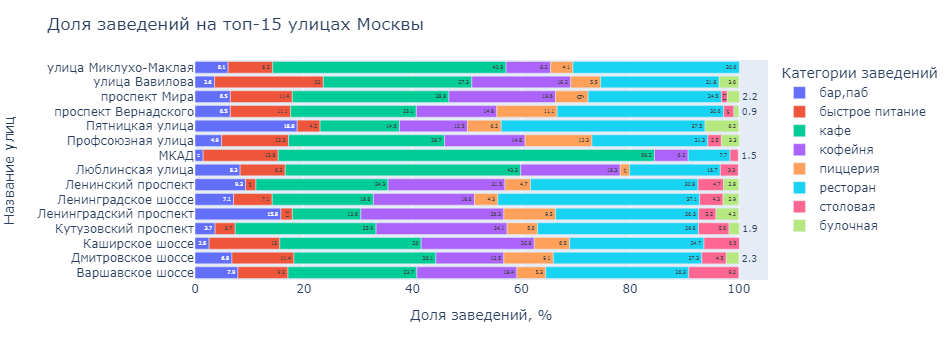

In [111]:
# строим диаграмму по долям заведений
fig = px.bar(df_top_street_category_all, x='part_category', y='street', color='category', text='part_category', orientation='h')
fig.update_layout(title='Доля заведений на топ-15 улицах Москвы',
                 xaxis_title='Доля заведений, %',
                 yaxis_title='Название улиц',
                 legend_title='Категории заведений')
fig.show()

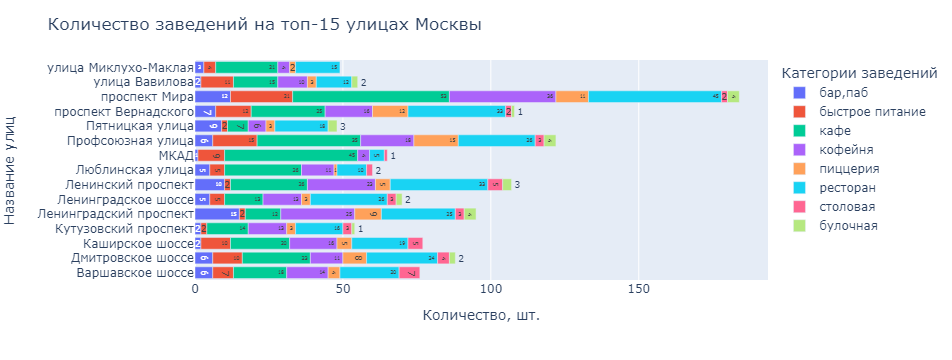

In [112]:
# строим диаграмму по количеству заведений
fig = px.bar(df_top_street_category_all, x='count', y='street', color='category', text='count', orientation='h')
fig.update_layout(title='Количество заведений на топ-15 улицах Москвы',
                 xaxis_title='Количество, шт.',
                 yaxis_title='Название улиц',
                 legend_title='Категории заведений')
fig.show()

Проведя детализацию по категориям заведений видим, что проспект Мира лидирует лишь в половине категорий - быстрое питание, кафе, кофейня, ресторан. Больше всего баров и пабов на Ленинградском проспекте, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе, по булочным паритет между Ленинградским проспектом, проспектом Мира и Профсоюзной улице - по 4.<br>
Если смотреть на абсолютные величины - % относительно остальных заведений которые там присутствуют видим, что на всех улицах в основном преобладают кафе и рестораны. На МКАДе самая высокая "плотность" кафе, на Пятницкой улице - бары и пабы, на улице Вавилова - быстрое питание, на Ленинградском проспекте - кофейни, на Профсоюзной улице - пиццерии.

Найдём улицы на которых есть всего одно заведение.

In [113]:
df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name').query('name == 1').count()


name    458
dtype: int64

Всего 458 улиц на которых находится по одному заведению. Здесь можно рассмотреть несколько гипотез:
- заведения без конкурентов это не очень хорошо, как для самого заведения, так и для клиентов с точки зрения качества;
- это могут быть нишевые заведения, которые ориентированы на определенных клиентов. В эти заведения приходят за самой атмосферой и обстановкой, либо за определенной кухней и меню.

### Медиана среднего чека заведений по административным районам

In [114]:
df_district_avg_bill = df.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False).reset_index(drop=True)
df_district_avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Самые дорогие районы по среднему чеку оказались ЦАО и ЗАО.<br>
Детализируем по категориям заведений. И визуализируем для проведения анализа.

In [115]:
df_district_category_avg_bill = df.pivot_table(index=['district', 'category'], values='middle_avg_bill', aggfunc='median').reset_index()
df_district_category_avg_bill.head()

,district,category,middle_avg_bill
0,Восточный административный округ,"бар,паб",1200.0
1,Восточный административный округ,булочная,300.0
2,Восточный административный округ,быстрое питание,375.0
3,Восточный административный округ,кафе,450.0
4,Восточный административный округ,кофейня,400.0


In [116]:
# заменяем длинные названия на короткие абревиатуры
df_district_category_avg_bill['district'] = ['ВАО'] * 8 + ['ЗАО'] * 8 + ['САО'] * 8 + ['СВАО'] * 8 + ['СЗАО'] * 8 + ['ЦАО'] * 8 + ['ЮВАО'] * 8 + ['ЮЗАО'] * 8 + ['ЮАО'] * 8
df_district_category_avg_bill.head()

,district,category,middle_avg_bill
0,ВАО,"бар,паб",1200.0
1,ВАО,булочная,300.0
2,ВАО,быстрое питание,375.0
3,ВАО,кафе,450.0
4,ВАО,кофейня,400.0


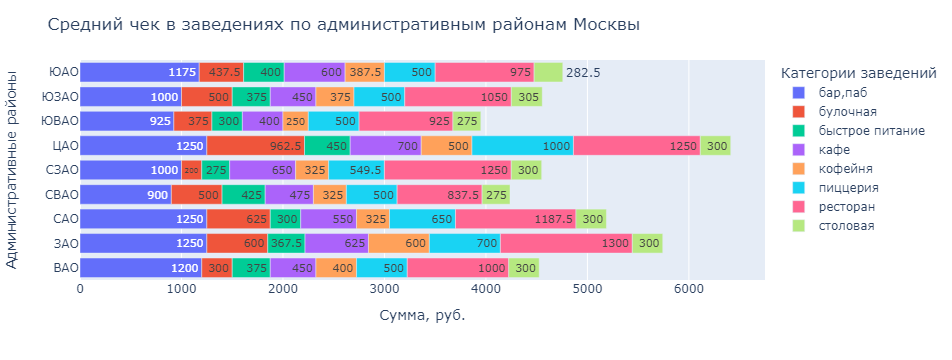

In [117]:
# построим столбчатую диаграмму
fig = px.bar(df_district_category_avg_bill, x='middle_avg_bill', y='district', color='category', text='middle_avg_bill', orientation='h')
fig.update_layout(title='Средний чек в заведениях по административным районам Москвы',
                 xaxis_title='Сумма, руб.',
                 yaxis_title='Административные районы',
                 legend_title='Категории заведений')
fig.show()

После детализации картина не меняется. Но по некоторым категориям заведений в ЦАО и ЗАО не самые высокие чеки. Так, одинаковые чеки в категории бар, паб между ЦАО, САО и ЗАО. В категории столовая разница минимальна по всем округам и находится в диапазоне 275 - 305 руб.

<div style="background-color: #CCCCCC;">

**Выводы:**<br>
Проведено исследование заведений по предоставленным исходным данным.
В нашей выборке представлены следующие категории заведений:
- кафе - 2378;
- рестораны - 2043;
- кофейня - 1413;
- бар,паб - 765;
- пиццерия - 633;
- быстрое питание - 603;
- столовая - 315;
- булочная - 256.

Анализ посадочных мест по категориям заведений показал следующее:
- в ресторанах и кофейнях самое большое количество посадочных мест - 100 мест;
- в кафе, барах и пабах, столовых в среднем от 40 до 60 мест;
- в категориях быстрое питание и булочная в основном нет посадочных мест;
- пиццерия - категория заведения с самым маленьким количеством посадочных мест - 20 мест.<br>
При этом в каждой категории присутствуют заведения без посадочных мест. Скорее всего это связано с наличием общей фуд зоны в крупных торговых центрах, а также с особенностями самих заведений.<br>

Сетевые заведения представлены во всех категориях заведений. По количеству, больше всего в категориях кафе, ресторан и кофейня. Что логично, ведь это самые многочисленные категории. Но если смотреть в процентном соотношении то картина меняется в корне. Самая большая доля у булочных и пиццерий, но есть категория которая попала в тройку и по количеству и по процентному соотношению - это кофейни.<br>

В топ-15 самых популярных сетей в Москве вошли следующие категории:
- кофейня - 5;
- ресторан - 3;
- кафе - 3;
- пиццерия - 2;
- быстрое питание - 1;
- булочная - 1.<br>
Абсолютным лидером является сеть кофеин Шоколадница - 120 заведений. Далее идут две пиццерии Домино'с Пицца - 76 заведений и Додо Пицца - 74 заведений.<br>

В выборке представлено 9 административных районов Москвы. Лидером по количеству заведений является Центральный административный округ - 2242 заведения, причем по всем категориям, за исключением быстрого питания, которое относительно равномерно представлено во всех административных районах. Меньше всего заведений в Северо-Западном административном округе - 409.<br>

Анализ рейтингов показал, что в целом средний рейтинг заведения находится в диапазоне 4.1 - 4.4. Самый высокий в категории бары и пабы - 4.4, самый низкий в быстром питании - 4.1.<br>

По административным районом рейтинги также не сильно отличаются и находятся в том же диапазоне 4.1 - 4.4. Самый высокий 4.4 - в ЦАО, а самый низкий 4.1 - в ЮВАО.<br>

В топ-15 по количеству заведений вошли следующие улицы в Москве:
- проспект Мира - 184;
- Профсоюзная улица - 122;
- проспект Вернадского - 108;
- Ленинский проспект - 107;
- Ленинградский проспект - 95;
- Дмитровское шоссе - 88;
- Каширское шоссе - 77;
- Варшавское шоссе - 76;
- Ленинградское шоссе - 70;
- МКАД - 65;
- Люблинская улица - 60;
- улица Вавилова - 55;
- Кутузовский проспект - 54;
- улица Миклухо-Маклая - 49;
- Пятницкая улица - 48.<br>

Проведя детализацию по категориям заведений обнаружили, что проспект Мира лидирует лишь в половине категорий - быстрое питание, кафе, кофейня, ресторан. Больше всего баров и пабов на Ленинградском проспекте, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе, по булочным паритет между Ленинградским проспектом, проспектом Мира и Профсоюзной улице - по 4.
Если смотреть на процентное соотношение то видно, что на МКАДе самая высокая "плотность" кафе, на Пятницкой улице - баров и пабов, на улице Вавилова - быстрого питания, на Ленинградском проспекте - кофеин, на Профсоюзной улице - пиццерий.<br>

Размер среднего чека по округам следующий:
- Центральный административный округ	1000;
- Западный административный округ	1000;
- Северо-Западный административный округ	700;
- Северный административный округ	650;
- Юго-Западный административный округ	600;
- Восточный административный округ	575;
- Северо-Восточный административный округ	500;
- Южный административный округ	500;
- Юго-Восточный административный округ	450.<br>

То есть самый высокий средний чек в ЦАО и ЗАО. После детализации по категориям картина не меняется. Но по некоторым категориям заведений в ЦАО и ЗАО не самые высокие чеки. Так, одинаковые чеки в категории бар, паб между ЦАО, САО и ЗАО. В категории столовая разница минимальна по всем округам и находится в диапазоне 275 - 305 руб.
</div>

## Открытие кофейни

В нашей выборке всего 1413 кофеен. Посмотрим распредедение по округам.

In [118]:
df_district_coffee = df_district.query('category == "кофейня"').sort_values(by='name', ascending=False).reset_index(drop=True)
df_district_coffee

,district,category,name
0,Центральный административный округ,кофейня,428
1,Северный административный округ,кофейня,193
2,Северо-Восточный административный округ,кофейня,159
3,Западный административный округ,кофейня,150
4,Южный административный округ,кофейня,131
5,Восточный административный округ,кофейня,105
6,Юго-Западный административный округ,кофейня,96
7,Юго-Восточный административный округ,кофейня,89
8,Северо-Западный административный округ,кофейня,62


Больше всего кофеен в ЦАО - 428, самое маленькое количество в СЗАО - 62.

In [119]:
# создали выборку по кофейням для отображения на карте Москвы
df_coffee = df.query('category == "кофейня"')

In [120]:
# представим на карте кофейни с рейтингами
m2 = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10, 
        tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m2)

def create_cluster(row):
    Marker([row['lat'], row['lng']],
           popup = f"{row['name']} {row['rating']}").add_to(marker_cluster)
    
df_coffee.apply(create_cluster, axis=1)

m2

Отобразили кофейни на карте Москвы. В основном они расположены вдоль крупных улиц, туристических маршрутов и в торговых центрах. Не очень большая плотность в таких районах как Рязанский, Люблино, Богородское, Черкизово, Перово, Дегунино и Западное Дегунино. В ЦАО почти нет кофеен между ул. Арбат и ул. Пречистенка, а также в районе Тверской ул.

In [121]:
# считаем круглосуточные кофейни
df_coffee.query('is_24_7 == 1')['name'].count()

59

В Москве всего 59 круглосуточных кофейни.

In [122]:
df_coffee.query('is_24_7 == 1').groupby('district', as_index=False)['name']. \
    count().sort_values(by='name', ascending=False)

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


Больше всего круглосуточных кофеен в ЦАО, расчитанных скорее всего на туристов. По одной круглосуточной кофейне в ЮВАО и ЮАО.

In [123]:
df_coffee.query('rating == 5.0')['chain'].value_counts()

chain
0    30
1     7
Name: count, dtype: int64

37 кофеен имеет рейтин 5.0. Причём 30 из них не сетевые заведения. Конечно здесь ещё важен такой параметр, как количество оценок, поэтому рейтинг в данном виде не совсем объективный критерий. 

In [124]:
df_coffee['middle_coffee_cup'].describe()

count    521.000000
mean     172.545106
std       65.816633
min       60.000000
25%      124.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Анализ стоимости чашечки капучино показал следующее:
- диапазон от минимального до максимального составляет от 60 до 375 руб.;
- медиана составляет 170 руб.

Посмотрим на распределение.

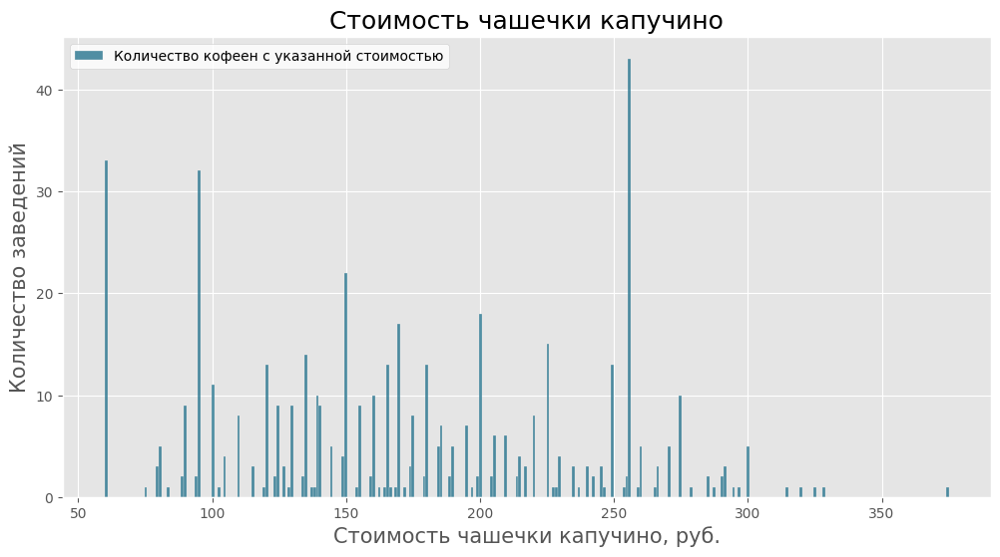

In [125]:
# строим гистограмму стоимости чашечки капучино
plt.figure(figsize=(12,6))
sns.histplot(x='middle_coffee_cup', bins=300, data=df_coffee, \
             color='#176B87', \
             label='Количество кофеен с указанной стоимостью')
plt.legend(facecolor='white')
plt.xlabel('Стоимость чашечки капучино, руб.', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
plt.title('Стоимость чашечки капучино', fontsize=18);

Распределение по стоимости показывает пики на отметках 60, 95 и 255 руб.<br>
Детализируем по округам.

In [126]:
df_coffee.groupby('district', as_index=False)['middle_coffee_cup']. \
    median().sort_values(by='middle_coffee_cup', ascending=False).reset_index(drop=True)

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Самая дорогая чашечка капучино будет в ЮЗАО - 198 руб., а самая дешевая в ВАО - 135 руб.

Проверим на наличие кофеен три самых "густонаселенных" общественным питанием торговых центра Москвы.

In [127]:
df_coffee.query('address == "Москва, проспект Вернадского, 86В"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
6687,Па Па Кофе,кофейня,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–01:00; вс 10:00...",55.661688,37.480076,4.2,средние,Цена чашки капучино:от 300 ₽,NaN,300.0,0,NaN,проспект Вернадского,False


In [128]:
df_coffee.query('address == "Москва, Усачёва улица, 26"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4085,Noba coffee,кофейня,"Москва, Усачёва улица, 26",Центральный административный округ,"пн-чт 08:00–22:00; пт,сб 08:00–23:00; вс 08:00...",55.727471,37.567488,4.5,NaN,Цена чашки капучино:200–250 ₽,NaN,225.0,1,100.0,Усачёва улица,False
6258,Кофемания Bez Tarelok,кофейня,"Москва, Усачёва улица, 26",Центральный административный округ,"ежедневно, 07:30–22:00",55.727498,37.567326,4.1,NaN,NaN,NaN,NaN,0,100.0,Усачёва улица,False


In [129]:
df_coffee.query('address == "Москва, Ярцевская улица, 19"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3034,Udcкафе,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738812,37.410703,4.3,средние,Средний счёт:700–1000 ₽,850.0,NaN,1,28.0,Ярцевская улица,False
3056,Cinnabon,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738659,37.410112,4.3,NaN,NaN,NaN,NaN,1,28.0,Ярцевская улица,False
3071,Шоколадница,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738692,37.410416,4.2,NaN,NaN,NaN,NaN,1,28.0,Ярцевская улица,False
3095,ДаблБи,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 08:00–22:00",55.738393,37.410080,4.0,средние,Цена чашки капучино:250–350 ₽,NaN,300.0,1,28.0,Ярцевская улица,False


Как мы видим в этих местах есть кофейни, 1 в ТЦ Парк Фудхолл, 2 в ТЦ Усачевский рынок и 4 в ТЦ Кунцево Плаза. Рейтинги не самые высокие от 4.0 до 4.5. В ТЦ Кунцево Плаза кофейни все сетевые,в ТЦ Усачевский рынок одна сетевая и одна частная, в ТЦ Парк Фудхолл одна частная. Цены за чашечку капучино гораздо выше средней по округу. Посадочные места в этих кофейнях скорее всего общие, так как указано одинаковое количество для каждого ТЦ, за исключением ТЦ Парк Фудхолл - там посадочные места не указаны.<br>
ТЦ Парк Фудхолл можно рассматривать для открытия кофейни.

<div style="background-color: #CCCCCC;">

**Выводы:**<br>
В нашей выборке всего 1413 кофеен, из них всего 59 круглосуточных. По округам распределены следующим образом:
- ЦАО - 428;
- САО - 193;
- СВАО - 159;
- ЗАО - 150;
- ЮАО - 131;
- ВАО - 105;
- ЮЗАО - 96;
- ЮВАО - 89;
- СЗАО - 62.

В основном они расположены вдоль крупных улиц, туристических маршрутов и в торговых центрах. Не очень большая плотность в таких районах как Рязанский, Люблино, Богородское, Черкизово, Перово, Дегунино и Западное Дегунино. В ЦАО почти нет кофеен между ул. Арбат и ул. Пречистенка, а также в районе Тверской ул.<br>
Больше всего круглосуточных кофеен в ЦАО, расчитанных скорее всего на туристов. По одной круглосуточной кофейне в ЮВАО и ЮАО.<br>

Анализ стоимости чашечки капучино показал следующее:
- диапазон цен составляет от 60 до 375 руб.;
- средняя стоимость составляет 170 руб.<br>
Распределение по стоимости показывает пики на отметках 60, 95 и 255 руб.
По округам самая дорогая чашечка капучино будет в ЮЗАО - 198 руб., а самая дешевая в ВАО - 135 руб.
</div>

## Общие выводы

<div style="background-color: #CCCCCC;">

Мы провели исследование рынка общественного питания в Москве на основе данных, составленных с помощью сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года, с целью выработки рекомендаций для выбора расположения кофейни и диапазона цен для меню.<br>

Прочитали исходный файл и посмотрели на первые строки таблицы, а также на общую информацию. Всего 8406 строк, что скорее всего означает общее количество заведений. Выявлено значительное количество пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, и небольшой процент пропусков в столбце hours.<br>

Провели предобработку исходных данных, а также изучили содержание каждого столбца.<br>
Явных дубликатов не обнаружено. Часть пропусков удалось обработать только в столбце price.<br>
В нашей выборке присутствуют обезличенные названия заведений, такие как: Кафе, Ресторан, Столовая.<br>

Ошибки могли возникнуть по следующим причинам:<br>
- по техническим - сбой при формировании исходных данных;
- человеческий фактор - при вводе информации пользователями были введены недостоверные или ошибочные данные.

Добавили новые столбцы street и is_24_7 для проведения исследования.<br>

Основное исследование.<br>
В нашей выборке представлены следующие категории заведений:
- кафе - 2378;
- рестораны - 2043;
- кофейня - 1413;
- бар,паб - 765;
- пиццерия - 633;
- быстрое питание - 603;
- столовая - 315;
- булочная - 256.

Анализ посадочных мест по категориям заведений показал следующее:
- в ресторанах и кофейнях самое большое количество посадочных мест - 100 мест;
- в кафе, барах и пабах, столовых в среднем от 40 до 60 мест;
- в категориях быстрое питание и булочная в основном нет посадочных мест;
- пиццерия - категория заведения с самым маленьким количеством посадочных мест - 20 мест.<br>
При этом в каждой категории присутствуют заведения без посадочных мест. Скорее всего это связано с наличием общей фуд зоны в крупных торговых центрах, а также с особенностями самих заведений.<br>

Сетевые заведения представлены во всех категориях заведений. По количеству, больше всего в категориях кафе, ресторан и кофейня. Что логично, ведь это самые многочисленные категории. Но если смотреть в процентном соотношении то картина меняется в корне. Самая большая доля у булочных и пиццерий, но есть категория которая попала в тройку и по количеству и по процентному соотношению - это кофейни.<br>

В топ-15 самых популярных сетей в Москве вошли следующие категории:
- кофейня - 5;
- ресторан - 3;
- кафе - 3;
- пиццерия - 2;
- быстрое питание - 1;
- булочная - 1.<br>
Абсолютным лидером является сеть кофеин Шоколадница - 120 заведений. Далее идут две пиццерии Домино'с Пицца - 76 заведений и Додо Пицца - 74 заведений.<br>

В выборке представлено 9 административных районов Москвы. Лидером по количеству заведений является Центральный административный округ - 2242 заведения, причем по всем категориям, за исключением быстрого питания, которое относительно равномерно представлено во всех административных районах. Меньше всего заведений в Северо-Западном административном округе - 409.<br>

Анализ рейтингов показал, что в целом средний рейтинг заведения находится в диапазоне 4.1 - 4.4. Самый высокий в категории бары и пабы - 4.4, самый низкий в быстром питании - 4.1.<br>

По административным районом рейтинги также не сильно отличаются и находятся в том же диапазоне 4.1 - 4.4. Самый высокий 4.4 - в ЦАО, а самый низкий 4.1 - в ЮВАО.<br>

В топ-15 по количеству заведений вошли следующие улицы в Москве:
- проспект Мира - 184;
- Профсоюзная улица - 122;
- проспект Вернадского - 108;
- Ленинский проспект - 107;
- Ленинградский проспект - 95;
- Дмитровское шоссе - 88;
- Каширское шоссе - 77;
- Варшавское шоссе - 76;
- Ленинградское шоссе - 70;
- МКАД - 65;
- Люблинская улица - 60;
- улица Вавилова - 55;
- Кутузовский проспект - 54;
- улица Миклухо-Маклая - 49;
- Пятницкая улица - 48.<br>
Проведя детализацию по категориям заведений обнаружили, что проспект Мира лидирует лишь в половине категорий - быстрое питание, кафе, кофейня, ресторан. Больше всего баров и пабов на Ленинградском проспекте, пиццерий - на Профсоюзной улице, столовых - на Варшавском шоссе, по булочным паритет между Ленинградским проспектом, проспектом Мира и Профсоюзной улице - по 4.
Если смотреть на процентное соотношение то видно, что на МКАДе самая высокая "плотность" кафе, на Пятницкой улице - баров и пабов, на улице Вавилова - быстрого питания, на Ленинградском проспекте - кофеин, на Профсоюзной улице - пиццерий.<br>

Размер среднего чека по округам следующий:
- Центральный административный округ	1000;
- Западный административный округ	1000;
- Северо-Западный административный округ	700;
- Северный административный округ	650;
- Юго-Западный административный округ	600;
- Восточный административный округ	575;
- Северо-Восточный административный округ	500;
- Южный административный округ	500;
- Юго-Восточный административный округ	450.<br>
То есть самый высокий средний чек в ЦАО и ЗАО. После детализации по категориям картина не меняется. Но по некоторым категориям заведений в ЦАО и ЗАО не самые высокие чеки. Так, одинаковые чеки в категории бар, паб между ЦАО, САО и ЗАО. В категории столовая разница минимальна по всем округам и находится в диапазоне 275 - 305 руб.

Детализация исследования: открытие кофейни.<br>
В нашей выборке всего 1413 кофеен, из них всего 59 круглосуточных. По округам распределены следующим образом:
- ЦАО - 428;
- САО - 193;
- СВАО - 159;
- ЗАО - 150;
- ЮАО - 131;
- ВАО - 105;
- ЮЗАО - 96;
- ЮВАО - 89;
- СЗАО - 62.

В основном они расположены вдоль крупных улиц, туристических маршрутов и в торговых центрах. Не очень большая плотность в таких районах как Рязанский, Люблино, Богородское, Черкизово, Перово, Дегунино и Западное Дегунино. В ЦАО почти нет кофеен между ул. Арбат и ул. Пречистенка, а также в районе Тверской ул.<br>
Больше всего круглосуточных кофеен в ЦАО, расчитанных скорее всего на туристов. По одной круглосуточной кофейне в ЮВАО и ЮАО.<br>

Анализ стоимости чашечки капучино показал следующее:
- диапазон цен составляет от 60 до 375 руб.;
- средняя стоимость составляет 170 руб.<br>
Распределение по стоимости показывает пики на отметках 60, 95 и 255 руб.
По округам самая дорогая чашечка капучино будет в ЮЗАО - 198 руб., а самая дешевая в ВАО - 135 руб.

В Москве есть такие места в которых расположены более 20 заведений общественного питания. Казалось бы, такое количество заведений расположенных в одном месте, говорит о большой конкуренции, а следовательно и небольшому стартапу там не выдержать этой конкуренции. Но с другой стороны может быть именно поэтому там такое количество заведений, потому что именно там большая проходимость, потому что именно за этим туда приходят посетители - за разнообразием. Изучив тройку адресов лидеров по количеству мест общественного питания получили следующее.<br>
По всем трём адресам есть кофейни, одна в ТЦ Парк Фудхолл, две в ТЦ Усачевский рынок и четыре в ТЦ Кунцево Плаза. Рейтинги не самые высокие от 4.0 до 4.5. В ТЦ Кунцево Плаза все кофейни сетевые, в ТЦ Усачевский рынок одна сетевая и одна частная, в ТЦ Парк Фудхолл одна частная. Цены за чашечку капучино гораздо выше средней по округу. Посадочные места в этих кофейнях скорее всего общие, так как указано одинаковое количество для каждого ТЦ, за исключением ТЦ Парк Фудхолл - там посадочные места не указаны.<br>

ТЦ Парк Фудхолл можно рассматривать для открытия кофейни. Конкурентная цена для чашечки кофе будет 200 - 250 руб. Этот диапазон выше средней цены по округу - 190 руб., но ниже чем у конкурентов - 300 руб. Также составит конкуренцию наличие своих посадочных мест.<br>

Ещё можно рекомендовать районы Дегунино и Западное Дегунино, расположенные в СЗАО, в котором самое маленькое количество кофеен. Средняя цена на чашечку кофе на которую необходимо ориентироваться составляет 165 руб. Оптимальное количество посадочных мест 20 - 40 мест.
</div>

In [130]:
# представим на карте рекомендованные места
m3 = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10, 
        tiles='Cartodb Positron')

deg_lat, deg_lng = 55.870399, 37.522945
food_holl_lat, food_holl_lng = 55.661688, 37.480076

marker_cluster = MarkerCluster().add_to(m3)

Marker([deg_lat, deg_lng],
           popup = f"Район Дегунино и Западное Дегунино").add_to(marker_cluster)
Marker([food_holl_lat, food_holl_lng],
           popup = f"ТЦ Фуд Холл").add_to(marker_cluster)    
m3

Презентация: <https://disk.yandex.ru/i/mk_BYmcZwm4enQ>